# Build a model to predict the sales of Bigmart 


# Objective: -



The goal of this challenge is to build a machine learning model that predicts and find out the sales of each product at a particular store.

Using this model, BigMart will try to understand the properties of products and stores which play a key role in increasing sales.

# Dataset: -

The data scientists at BigMart have collected 2013 sales data for 1559 products across 10 stores in different cities. Also, certain attributes of each product and store have been defined. 

###    Variable                        -->                               Description
                            
* 1. Item_Identifier        -->           Unique product ID

* 2. Item_Weight            -->            Weight of product

* 3. Item_Fat_Content       -->            Whether the product is low fat or not

* 4. Item _Visibility       -->            The % of total display area of all products in a store allocated to the                                            particular product

* 5. Item_Type              -->            The category to which the product belongs


* 6. Item_MRP               -->            Maximum Retail Price (list price) of the product

* 7. Outlet_Identifier      -->            Unique store ID

* 8. Outlet_Establishment_Year -->         The year in which store was established

* 9. Outlet_Size            -->            The size of the store in terms of ground area covered

* 10. Outlet_Location_Туре   -->           The type of city in which the store is located

* 11. Outlet_Type          -->             Whether the outlet is just a grocery store or some sort of supermarket

* 12. Item_Outlet_Sales    -->             Sales of the product in the paticular store. This is the outcome                                                     varaible to be predicted
                            
          
               
 
               


# Step 1: Import all the required libraries

- __Pandas__ : In computer programming, pandas is a software library written for the Python programming language for data manipulation and analysis and storing in a proper way. In particular, it offers data structures and operations for manipulating numerical tables and time series
- __Sklearn__ : Scikit-learn (formerly scikits.learn) is a free software machine learning library for the Python programming language. It features various classification, regression and clustering algorithms including support vector machines, random forests, gradient boosting, k-means and DBSCAN, and is designed to interoperate with the Python numerical and scientific libraries NumPy and SciPy. The library is built upon the SciPy (Scientific Python) that must be installed before you can use scikit-learn.
- __Pickle__ : Python pickle module is used for serializing and de-serializing a Python object structure. Pickling is a way to convert a python object (list, dict, etc.) into a character stream. The idea is that this character stream contains all the information necessary to reconstruct the object in another python script.
- __Seaborn__ : Seaborn is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics.
- __Matplotlib__ : Matplotlib is a plotting library for the Python programming language and its numerical mathematics extension NumPy. It provides an object-oriented API for embedding plots into applications using general-purpose GUI toolkits like Tkinter, wxPython, Qt, or GTK.

In [ ]:
#Loading libraries 
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
import sklearn.linear_model 
import sklearn
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import scale 
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.decomposition import PCA
import warnings




warnings.filterwarnings('ignore')

# Step 2 : Read dataset and basic details of dataset
Goal:- In this step we are going to read the dataset, view the dataset and analysis the basic details like total number of rows and columns, what are the column data types and see to need to create new column or not.


In this stage we are going to read our problem dataset and have a look on it.

In [ ]:
#loading the dataset
try:
    df = pd.read_csv('/Users/amitpandey/Downloads/archive/Train.csv') #Path for the file
    print('Data read done successfully...')
except (FileNotFoundError, IOError):
    print("Wrong file or file path")   

Data read done successfully...


In [ ]:
# To view the content inside the dataset we can use the head() method that returns a specified number of rows, string from the top. 
# The head() method returns the first 5 rows if a number is not specified.
df.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


# Step3: Data Preprocessing

**Why need of Data Preprocessing?**

Preprocessing data is an important step for data analysis. The following are some benefits of preprocessing data:

 - It improves accuracy and reliability. Preprocessing data removes missing or inconsistent data values resulting from human or computer error, which can improve the accuracy and quality of a dataset, making it more reliable.
 - It makes data consistent. When collecting data, it's possible to have data duplicates, and discarding them during preprocessing can ensure the data values for analysis are consistent, which helps produce accurate results.
 - It increases the data's algorithm readability. Preprocessing enhances the data's quality and makes it easier for machine learning algorithms to read, use, and interpret it.

After we read the data, we can look at the data using:

In [ ]:
# count the total number of rows and columns.
print ('The train data has {0} rows and {1} columns'.format(df.shape[0],df.shape[1]))

The train data has 8523 rows and 12 columns


#### The df.value_counts() method counts the number of types of values a particular column contains. 

In [ ]:
df.shape

(8523, 12)

#### The df.shape method shows the shape of the dataset. 

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB


#### The df.info() method prints information about a DataFrame including the index dtype and columns, non-null values and memory usage. 

In [ ]:
df.iloc[1]

Item_Identifier                          DRC01
Item_Weight                               5.92
Item_Fat_Content                       Regular
Item_Visibility                       0.019278
Item_Type                          Soft Drinks
Item_MRP                               48.2692
Outlet_Identifier                       OUT018
Outlet_Establishment_Year                 2009
Outlet_Size                             Medium
Outlet_Location_Type                    Tier 3
Outlet_Type                  Supermarket Type2
Item_Outlet_Sales                     443.4228
Name: 1, dtype: object

####  df.iloc[ ] is primarily integer position based (from 0 to length-1 of the axis), but may also be used with a boolean array. The iloc property gets, or sets, the value(s) of the specified indexes.

### Data Type Check for every column

**Why data type check is required?**

Data type check helps us with understanding what type of variables our dataset contains. It helps us with identifying whether to keep that variable or not. If the dataset contains contiguous data, then only float and integer type variables will be beneficial and if we have to classify any value then categorical variables will be beneficial.

In [ ]:
objects_cols = ['object']
objects_lst = list(df.select_dtypes(include=objects_cols).columns)

In [ ]:
print("Total number of categorical columns are ", len(objects_lst))
print("There names are as follows: ", objects_lst)

Total number of categorical columns are  7
There names are as follows:  ['Item_Identifier', 'Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type']


In [ ]:
int64_cols = ['int64']
int64_lst = list(df.select_dtypes(include=int64_cols).columns)

In [ ]:
print("Total number of numerical columns are ", len(int64_lst))
print("There names are as follows: ", int64_lst)

Total number of numerical columns are  1
There names are as follows:  ['Outlet_Establishment_Year']


In [ ]:
float64_cols = ['float64']
float64_lst = list(df.select_dtypes(include=float64_cols).columns)

In [ ]:
print("Total number of float64 columns are ", len(float64_lst))
print("There name are as follow: ", float64_lst)

Total number of float64 columns are  4
There name are as follow:  ['Item_Weight', 'Item_Visibility', 'Item_MRP', 'Item_Outlet_Sales']


## Step 2 Insights: -

1) We have total 12 features where 7 of them are float type, 4 are object type and 1 is int type.

After this step we have to calculate various evaluation parameters which will help us in cleaning and analysing the data more accurately.

# Step 3: Descriptive Analysis

**Goal/Purpose:**  Finding the data distribution of the features. Visualization helps to understand data and also to explain the data to another person.

Things we are going to do in this step:

1. Mean
2. Median
3. Mode
4. Standard Deviation
5. Variance
6. Null Values
7. NaN Values
8. Min value
9. Max value
10. Count Value
11. Quatilers
12. Correlation
13. Skewness

In [ ]:
df.describe()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
count,7060.000000,8523.000000,8523.000000,8523.000000,8523.000000
mean,12.857645,0.066132,140.992782,1997.831867,2181.288914
std,4.643456,0.051598,62.275067,8.371760,1706.499616
min,4.555000,0.000000,31.290000,1985.000000,33.290000
25%,8.773750,0.026989,93.826500,1987.000000,834.247400
50%,12.600000,0.053931,143.012800,1999.000000,1794.331000
75%,16.850000,0.094585,185.643700,2004.000000,3101.296400
max,21.350000,0.328391,266.888400,2009.000000,13086.964800


#### The df.describe() method returns description of the data in the DataFrame. If the DataFrame contains numerical data, the description contains these information for each column: count - The number of not-empty values. mean - The average (mean) value. 

# Measure the variability of data of the dataset

Variability describes how far apart data points lie from each other and from the center of a distribution.

# 1. Standard Deviation

![Standard-Deviation-ADD-SOURCE-e838b9dcfb89406e836ccad58278f4cd.jpg](attachment:Standard-Deviation-ADD-SOURCE-e838b9dcfb89406e836ccad58278f4cd.jpg)

The standard deviation is the average amount of variability in your dataset.

It tells you, on average, how far each data point lies from the mean. The larger the standard deviation, the more variable the data set is and if zero variance then there is no variability in the dataset that means there no use of that dataset.


So, it helps in understanding the measurements when the data is distributed. The more the data is distributed, the greater will be the standard deviation of that data.Here, you as an individual can determine which company is beneficial in long term. But, if you didn't know the SD you would have choosen a wrong compnay for you.

In [ ]:
df.std()

Item_Weight                     4.643456
Item_Visibility                 0.051598
Item_MRP                       62.275067
Outlet_Establishment_Year       8.371760
Item_Outlet_Sales            1706.499616
dtype: float64

#### We can also understand the standard deviation using the below function. 

In [ ]:
def std_cal(df,float64_lst):
    
    cols = ['normal_value', 'zero_value']
    zero_value = 0
    normal_value = 0
    
    for value in float64_lst:
    
        rs = round(df[value].std(),6)

        if rs > 0:
            normal_value = normal_value + 1

        elif rs == 0:
            zero_value = zero_value + 1
    
    std_total_df =  pd.DataFrame([[normal_value, zero_value]], columns=cols) 
    
    return std_total_df

In [ ]:
std_cal(df, float64_lst)

,normal_value,zero_value
0,4,0


In [ ]:
int64_cols = ['int64']
int64_lst = list(df.select_dtypes(include=int64_cols).columns)
std_cal(df,int64_lst)

,normal_value,zero_value
0,1,0


zero_value -> is the zero variance and when then there is no variability in the dataset that means there no use of that dataset.



# 2. Variance

The variance is the average of squared deviations from the mean. A deviation from the mean is how far a score lies from the mean.

Variance is the square of the standard deviation. This means that the units of variance are much larger than those of a typical value of a data set.

![0_5NGAJWo_3-DsLKoV.png](attachment:0_5NGAJWo_3-DsLKoV.png)

![Variance-TAERM-ADD-Source-464952914f77460a8139dbf20e14f0c0.jpg](attachment:Variance-TAERM-ADD-Source-464952914f77460a8139dbf20e14f0c0.jpg)

#### Why do we used Variance ?

By Squairng the number we get non-negative computation i.e. Disperson cannot be negative.
The presence of variance is very important in your dataset because this will allow the model to learn about the different patterns hidden in the data

In [ ]:
df.var()

Item_Weight                  2.156169e+01
Item_Visibility              2.662335e-03
Item_MRP                     3.878184e+03
Outlet_Establishment_Year    7.008637e+01
Item_Outlet_Sales            2.912141e+06
dtype: float64

#### We can also understand the Variance using the below function.

In [ ]:
zero_cols = []

def var_cal(df,float64_lst):
    
    cols = ['normal_value', 'zero_value']
    zero_value = 0
    normal_value = 0
    
    for value in float64_lst:
    
        rs = round(df[value].var(),6)

        if rs > 0:
            normal_value = normal_value + 1

        elif rs == 0:
            zero_value = zero_value + 1
            zero_cols.append(value)
    
    var_total_df =  pd.DataFrame([[normal_value, zero_value]], columns=cols) 
    
    return var_total_df

In [ ]:
var_cal(df, float64_lst)

,normal_value,zero_value
0,4,0


In [ ]:
var_cal(df, int64_lst)

,normal_value,zero_value
0,1,0


zero_value -> Zero variance means that there is no difference in the data values, which means that they are all the same.

# Measure central tendency

A measure of central tendency is a single value that attempts to describe a set of data by identifying the central position within that set of data. As such, measures of central tendency are sometimes called measures of central location. They are also classed as summary statistics.



Mean - The average value. Median - The mid point value. Mode - The most common value.

# 1. Mean

![1_tjAEMZx_0uIYGUhxEnPXPw.png](attachment:1_tjAEMZx_0uIYGUhxEnPXPw.png)

The mean is the arithmetic average, and it is probably the measure of central tendency that you are most familiar.

#### Why do we calculate mean?




The mean is used to summarize a data set. It is a measure of the center of a data set.


In [ ]:
df.mean()

Item_Weight                    12.857645
Item_Visibility                 0.066132
Item_MRP                      140.992782
Outlet_Establishment_Year    1997.831867
Item_Outlet_Sales            2181.288914
dtype: float64

#### We can also understand the mean using the below function. 

In [ ]:
def mean_cal(df,int64_lst):
    
    cols = ['normal_value', 'zero_value']
    zero_value = 0
    normal_value = 0
    
    for value in int64_lst:
    
        rs = round(df[value].mean(),6)

        if rs > 0:
            normal_value = normal_value + 1

        elif rs == 0:
            zero_value = zero_value + 1
    
    mean_total_df =  pd.DataFrame([[normal_value, zero_value]], columns=cols) 
    
    return mean_total_df

In [ ]:
mean_cal(df, int64_lst)

,normal_value,zero_value
0,1,0


In [ ]:
mean_cal(df,float64_lst)

,normal_value,zero_value
0,4,0


zero_value -> that the mean of a paticular column is zero, which isn't usefull in anyway and need to be drop.

# 2.Median
![Alg1_14_02_0011-diagram_thumb-lg.png](attachment:Alg1_14_02_0011-diagram_thumb-lg.png)

The median is the middle value. It is the value that splits the dataset in half.The median of a dataset is the value that, assuming the dataset is ordered from smallest to largest, falls in the middle. If there are an even number of values in a dataset, the middle two values are the median.

#### Why do we calculate median ?

By comparing the median to the mean, you can get an idea of the distribution of a dataset. When the mean and the median are the same, the dataset is more or less evenly distributed from the lowest to highest values.The median will depict that the patient below median is Malignent and above that are Benign.

In [ ]:
df.median()

Item_Weight                    12.600000
Item_Visibility                 0.053931
Item_MRP                      143.012800
Outlet_Establishment_Year    1999.000000
Item_Outlet_Sales            1794.331000
dtype: float64

####  We can also understand the median using the below function. 

In [ ]:
def median_cal(df,int64_lst):
    
    cols = ['normal_value', 'zero_value']
    zero_value = 0
    normal_value = 0
    
    for value in int64_lst:
    
        rs = round(df[value].mean(),6)

        if rs > 0:
            normal_value = normal_value + 1

        elif rs == 0:
            zero_value = zero_value + 1
    
    median_total_df =  pd.DataFrame([[normal_value, zero_value]], columns=cols) 
    
    return median_total_df

In [ ]:
median_cal(df, float64_lst)

,normal_value,zero_value
0,4,0


In [ ]:
median_cal(df, int64_lst)

,normal_value,zero_value
0,1,0


zero_value -> that the median of a paticular column is zero which isn't usefull in anyway and need to be drop.

# 3. Mode
![Mode-1.png.webp](attachment:Mode-1.png.webp)
The mode is the value that occurs the most frequently in your data set. On a bar chart, the mode is the highest bar. If the data have multiple values that are tied for occurring the most frequently, you have a multimodal distribution. If no value repeats, the data do not have a mode.

#### Why do we calculate mode ?

The mode can be used to summarize categorical variables, while the mean and median can be calculated only for numeric variables. This is the main advantage of the mode as a measure of central tendency. It's also useful for discrete variables and for continuous variables when they are expressed as intervals.

In [ ]:
df.mode()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDG33,12.15,Low Fat,0.0,Fruits and Vegetables,172.0422,OUT027,1985.0,Medium,Tier 3,Supermarket Type1,958.752
1,FDW13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
def mode_cal(df,int64_lst):
    
    cols = ['normal_value', 'zero_value', 'string_value']
    zero_value = 0
    normal_value = 0
    string_value = 0
    
    for value in int64_lst:
                
        rs = df[value].mode()[0]
        
        if isinstance(rs, str):
            string_value = string_value + 1
        else:

            if rs > 0:
                normal_value = normal_value + 1

            elif rs == 0:
                zero_value = zero_value + 1
    
    mode_total_df =  pd.DataFrame([[normal_value, zero_value, string_value]], columns=cols) 
    
    return mode_total_df

In [ ]:
mode_cal(df, list(df.columns))

,normal_value,zero_value,string_value
0,4,1,7


zero_value -> that the mode of a paticular column is zero which isn't usefull in anyway and need to be drop.

# Null and Nan values

1. **Null Values**


![missing-values.png](attachment:missing-values.png)

A null value in a relational database is used when the value in a column is unknown or missing. A null is neither an empty string (for character or datetime data types) nor a zero value (for numeric data types).

In [ ]:
df.isnull().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

As we notice that there are null values in our dataset.
Mainly in Item_Weight & Outlet_Size.

2. **Nan Values**

![images.png](attachment:images.png)

NaN, standing for Not a Number, is a member of a numeric data type that can be interpreted as a value that is undefined or unrepresentable, especially in floating-point arithmetic.

In [ ]:
df.isna().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

### As we notice that there are nan values in our dataset. Mainly in Item_Weight & Outlet_Size

In [ ]:
# We have many ways to fill Null/Nan Values as below:

* mean -> average value (for numerical)
* mode -> most repeated value (for categorical)

In [ ]:
# finidng the mean of 'Item_Weight' 
df['Item_Weight'].mean()

12.857645184136183

In [ ]:
# Now, filling the NUll/NAN Values with the average of "Item_Weight"
df['Item_Weight'].fillna(df['Item_Weight'].mean(), inplace = True)

In [ ]:
df.isnull().sum()

Item_Identifier                 0
Item_Weight                     0
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

* As you can see now we have to deal with 'Outlet_Size'

In [ ]:
outlet_size_mode = df.pivot_table(values='Outlet_Size', columns='Outlet_Type', aggfunc=(lambda x: x.mode()[0]))
outlet_size_mode

Outlet_Type,Grocery Store,Supermarket Type1,Supermarket Type2,Supermarket Type3
Outlet_Size,Small,Small,Medium,Medium


* df.pivote_table job is to Create a spreadsheet-style pivot table as a DataFrame.

In [ ]:
missing_values = df['Outlet_Size'].isnull()
df.loc[missing_values, 'Outlet_Size'] = df.loc[missing_values, 'Outlet_Type'].apply(lambda x: outlet_size_mode[x])

* As it can be seen, we are filling the Null Values with the Outlet_Size['Small, Medium']

In [ ]:
#Cross-checking if any NULL/NAN Values are present or not
df.isnull().sum()

Item_Identifier              0
Item_Weight                  0
Item_Fat_Content             0
Item_Visibility              0
Item_Type                    0
Item_MRP                     0
Outlet_Identifier            0
Outlet_Establishment_Year    0
Outlet_Size                  0
Outlet_Location_Type         0
Outlet_Type                  0
Item_Outlet_Sales            0
dtype: int64

#### Another way to remove null and nan values is to use the method "df.dropna(inplace=True)". 

In [ ]:
# Visualizing our dataset

<AxesSubplot:xlabel='Outlet_Size', ylabel='count'>

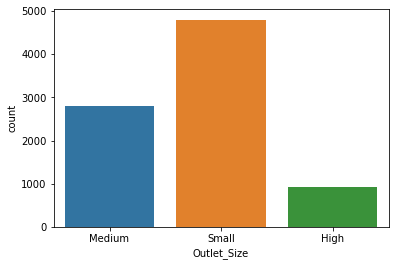

In [ ]:
sns.countplot(x='Outlet_Size', data = df)

### Majority of outlets in dataset are of small size

<AxesSubplot:xlabel='Item_Fat_Content', ylabel='count'>

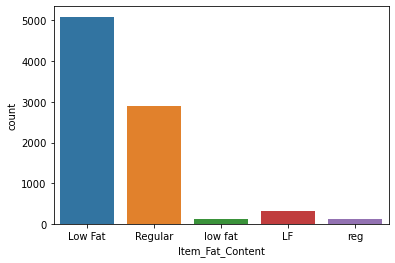

In [ ]:
sns.countplot(x='Item_Fat_Content', data = df)

### As you can see Item_Fat_Content has 5 values which we need to make more redable like making Low Fat, low fat & LF count as one, Regular & reg as one.

<AxesSubplot:xlabel='Item_Fat_Content', ylabel='count'>

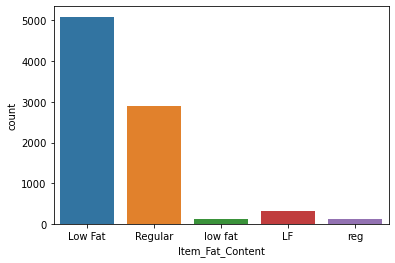

In [ ]:
sns.countplot(x='Item_Fat_Content', data = df)

### Majority of our items have low fat content  

<AxesSubplot:xlabel='count', ylabel='Outlet_Identifier'>

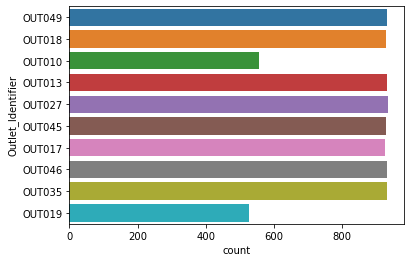

In [ ]:
sns.countplot(y='Outlet_Identifier', data = df)

### Cheking for Different item types in the data set

<AxesSubplot:xlabel='count', ylabel='Item_Type'>

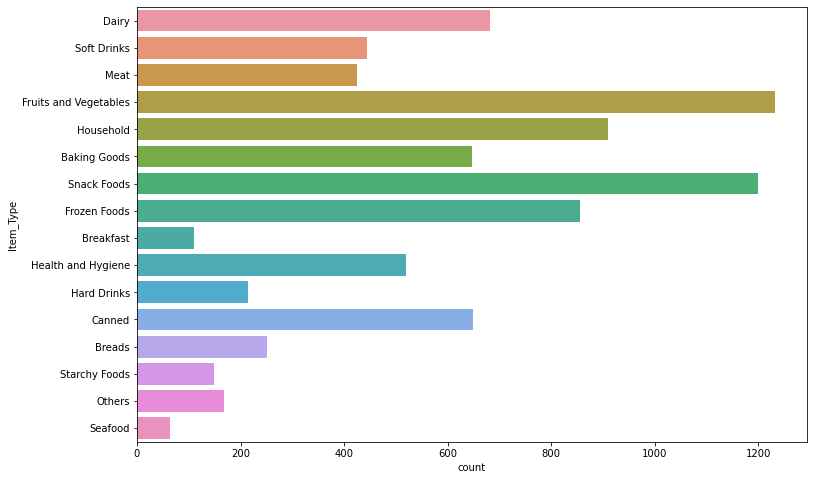

In [ ]:
plt.figure(figsize=(12,8))
sns.countplot(y='Item_Type', data = df)


### top availabe items are Fruits & Vegetables, followed by Snack Foods at oulets.

In [ ]:
# Checking Outlet_Type & Outlet_Location_Type column of dataset

<AxesSubplot:xlabel='count', ylabel='Outlet_Location_Type'>

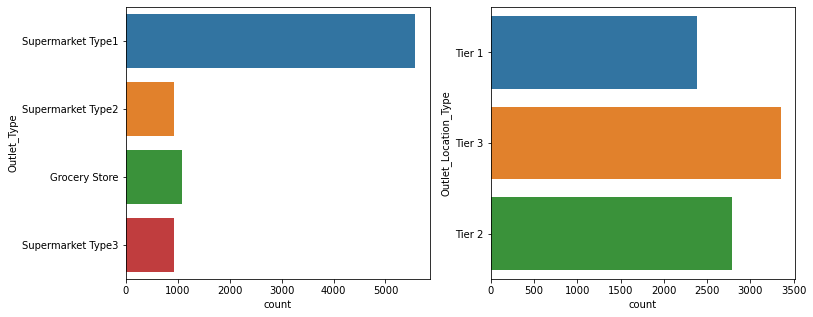

In [ ]:
fig, axes = plt.subplots (1,2, figsize= (12,5))
sns.countplot (y='Outlet_Type' , data = df, ax= axes [0])
sns.countplot (y='Outlet_Location_Type', data = df, ax= axes [1])

### Most of the Outelt types fall under Supermakrket Type1 & has location of Tier3

In [ ]:
# Checking numerical columns now

<AxesSubplot:>

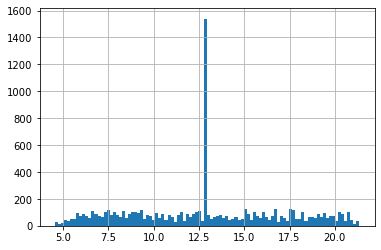

In [ ]:
df['Item_Weight'].hist(bins=100)

<AxesSubplot:>

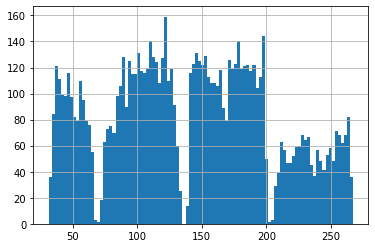

In [ ]:
df['Item_MRP'].hist(bins=100)

<AxesSubplot:>

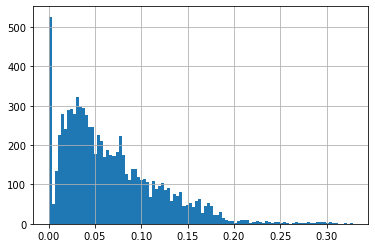

In [ ]:
df['Item_Visibility'].hist(bins=100)

<AxesSubplot:xlabel='Outlet_Establishment_Year', ylabel='count'>

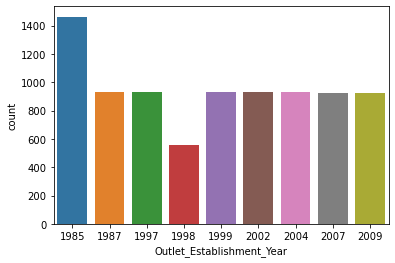

In [ ]:
sns.countplot(x='Outlet_Establishment_Year', data = df) 

### Majority of the outlet were establish in year 1985 whereas least number of outlets were establish in year 1998

In [ ]:
# Cheking individual data with repect to target data i.e. Item_Outlet_Sales

<AxesSubplot:xlabel='Item_Outlet_Sales', ylabel='Item_Type'>

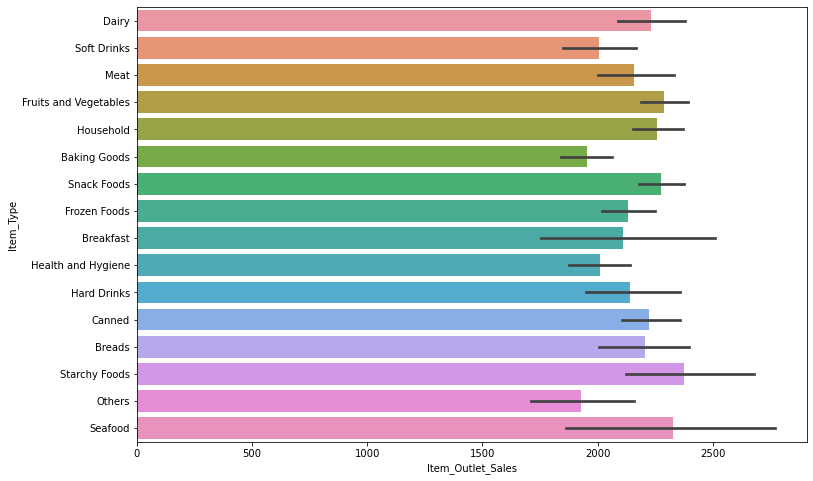

In [ ]:
plt.figure(figsize= (12,8))
sns.barplot (y='Item_Type', x='Item_Outlet_Sales', data =df)


### The item that are contrubuting highest to the outlet sales are Stachy Foods & Seafoods

In [ ]:
# Checking Item_Outlet_Sales with respect to outlet_Size

<AxesSubplot:xlabel='Outlet_Size', ylabel='Item_Outlet_Sales'>

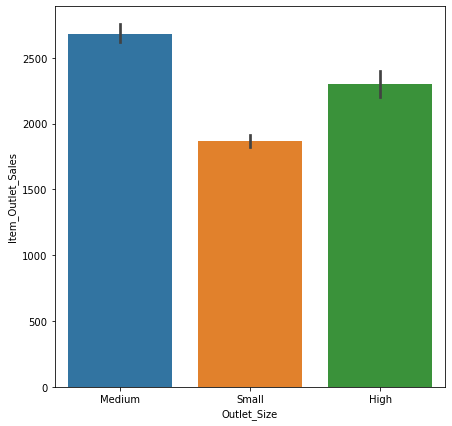

In [ ]:
plt.figure(figsize=(7,7))
sns.barplot(x='Outlet_Size',  y='Item_Outlet_Sales', data=df)


# Item Sales are higher for medium size outlet

In [ ]:
# Checkig Item_Outlet_Sales with respect to Outlet_Location_Type 

<function matplotlib.pyplot.legend(*args, **kwargs)>

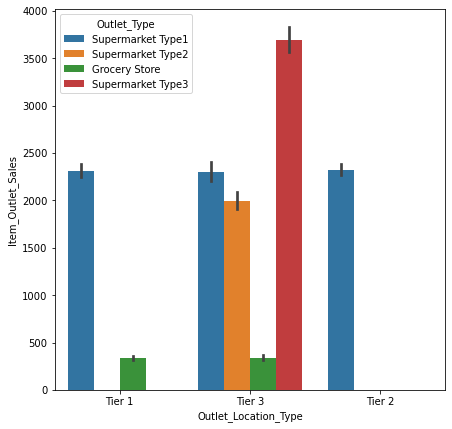

In [ ]:
plt.figure(figsize=(7,7))
sns.barplot('Outlet_Location_Type', 'Item_Outlet_Sales', hue='Outlet_Type' , data=df)
plt.legend


### Tier 3 has highest item sales

### Creating New Attributes

In [ ]:
#Here, we removed the string values afterwards [:2]
df['New_Item_Type'] = df['Item_Identifier'].apply(lambda x: x[:2])
df['New_Item_Type']

0       FD
1       DR
2       FD
3       FD
4       NC
        ..
8518    FD
8519    FD
8520    NC
8521    FD
8522    DR
Name: New_Item_Type, Length: 8523, dtype: object

In [ ]:
#Giving new names to 3 items so it can be more readable
df['New_Item_Type'] = df['New_Item_Type'].map({'FD':'Food', 'NC':'Non-Consumable', 'DR':'Drinks'})
df['New_Item_Type'].value_counts()

Food              6125
Non-Consumable    1599
Drinks             799
Name: New_Item_Type, dtype: int64

In [ ]:
#Categorizing the items 
df.loc[df['New_Item_Type']=='Non-Consumable', 'Item_Fat_Content'] = 'Non-Edible'
df['Item_Fat_Content'].value_counts()

Low Fat       3612
Regular       2889
Non-Edible    1599
LF             222
reg            117
low fat         84
Name: Item_Fat_Content, dtype: int64

In [ ]:
#Making it simpler
df['Outlet_Years'] = 2023 - df['Outlet_Establishment_Year']


In [ ]:
df['Outlet_Years']

0       24
1       14
2       24
3       25
4       36
        ..
8518    36
8519    21
8520    19
8521    14
8522    26
Name: Outlet_Years, Length: 8523, dtype: int64

In [ ]:
# combine item fat content
df['Item_Fat_Content'] = df['Item_Fat_Content'].replace({'LF':'Low Fat', 'reg':'Regular', 'low fat':'Low Fat'})
df['Item_Fat_Content'].value_counts()

Low Fat       3918
Regular       3006
Non-Edible    1599
Name: Item_Fat_Content, dtype: int64

In [ ]:
df

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,New_Item_Type,Outlet_Years
0,FDA15,9.300,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380,Food,24
1,DRC01,5.920,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228,Drinks,14
2,FDN15,17.500,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700,Food,24
3,FDX07,19.200,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,Small,Tier 3,Grocery Store,732.3800,Food,25
4,NCD19,8.930,Non-Edible,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052,Non-Consumable,36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8518,FDF22,6.865,Low Fat,0.056783,Snack Foods,214.5218,OUT013,1987,High,Tier 3,Supermarket Type1,2778.3834,Food,36
8519,FDS36,8.380,Regular,0.046982,Baking Goods,108.1570,OUT045,2002,Small,Tier 2,Supermarket Type1,549.2850,Food,21
8520,NCJ29,10.600,Non-Edible,0.035186,Health and Hygiene,85.1224,OUT035,2004,Small,Tier 2,Supermarket Type1,1193.1136,Non-Consumable,19
8521,FDN46,7.210,Regular,0.145221,Snack Foods,103.1332,OUT018,2009,Medium,Tier 3,Supermarket Type2,1845.5976,Food,14


In [ ]:
#after converting we need to drop columns which we dont need anymore from dataset

df = df.drop(['Item_Identifier', 'Outlet_Establishment_Year', 'Item_Type'], axis = 1)

In [ ]:
df

,Item_Weight,Item_Fat_Content,Item_Visibility,Item_MRP,Outlet_Identifier,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,New_Item_Type,Outlet_Years
0,9.300,Low Fat,0.016047,249.8092,OUT049,Medium,Tier 1,Supermarket Type1,3735.1380,Food,24
1,5.920,Regular,0.019278,48.2692,OUT018,Medium,Tier 3,Supermarket Type2,443.4228,Drinks,14
2,17.500,Low Fat,0.016760,141.6180,OUT049,Medium,Tier 1,Supermarket Type1,2097.2700,Food,24
3,19.200,Regular,0.000000,182.0950,OUT010,Small,Tier 3,Grocery Store,732.3800,Food,25
4,8.930,Non-Edible,0.000000,53.8614,OUT013,High,Tier 3,Supermarket Type1,994.7052,Non-Consumable,36
...,...,...,...,...,...,...,...,...,...,...,...
8518,6.865,Low Fat,0.056783,214.5218,OUT013,High,Tier 3,Supermarket Type1,2778.3834,Food,36
8519,8.380,Regular,0.046982,108.1570,OUT045,Small,Tier 2,Supermarket Type1,549.2850,Food,21
8520,10.600,Non-Edible,0.035186,85.1224,OUT035,Small,Tier 2,Supermarket Type1,1193.1136,Non-Consumable,19
8521,7.210,Regular,0.145221,103.1332,OUT018,Medium,Tier 3,Supermarket Type2,1845.5976,Food,14


In [ ]:
df.shape

(8523, 11)

# Count of unique occurences of every value in all categorical value



In [ ]:
objects = ['New_Item_Type', 'Outlet_Identifier', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type',]
           
for value in objects:
    
    print(f"{value:{10}} {df[value].value_counts()}")

New_Item_Type Food              6125
Non-Consumable    1599
Drinks             799
Name: New_Item_Type, dtype: int64
Outlet_Identifier OUT027    935
OUT013    932
OUT049    930
OUT046    930
OUT035    930
OUT045    929
OUT018    928
OUT017    926
OUT010    555
OUT019    528
Name: Outlet_Identifier, dtype: int64
Outlet_Size Small     4798
Medium    2793
High       932
Name: Outlet_Size, dtype: int64
Outlet_Location_Type Tier 3    3350
Tier 2    2785
Tier 1    2388
Name: Outlet_Location_Type, dtype: int64
Outlet_Type Supermarket Type1    5577
Grocery Store        1083
Supermarket Type3     935
Supermarket Type2     928
Name: Outlet_Type, dtype: int64


- Categorical data are variables that contain label values rather than numeric values.The number of possible values is often limited to a fixed set.
- Use Label Encoder to label the categorical data. Label Encoder is the part of SciKit Learn library in Python and used to convert categorical data, or text data, into numbers, which our predictive models can better understand.



__Label Encoding__ refers to converting the labels into a numeric form so as to convert them into the machine-readable form. Machine learning algorithms can then decide in a better way how those labels must be operated. It is an important pre-processing step for the structured dataset in supervised learning.

In [ ]:
#Before Encoding
df['New_Item_Type']

0                 Food
1               Drinks
2                 Food
3                 Food
4       Non-Consumable
             ...      
8518              Food
8519              Food
8520    Non-Consumable
8521              Food
8522            Drinks
Name: New_Item_Type, Length: 8523, dtype: object

In [ ]:
#Encoding categorical data values
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df.New_Item_Type = le.fit_transform(df.New_Item_Type)
#df.Item_Type = le.fit_transform(df.Item_Type)
df.Outlet_Size = le.fit_transform(df.Outlet_Size)
df.Outlet_Identifier= le.fit_transform(df.Outlet_Identifier)
df.Outlet_Location_Type = le.fit_transform(df.Outlet_Location_Type)
df.Outlet_Type = le.fit_transform(df.Outlet_Type)
df.Item_Fat_Content = le.fit_transform(df.Item_Fat_Content)

In [ ]:
#After encoding or converting categorical col values into numbers
df['New_Item_Type']

0       1
1       0
2       1
3       1
4       2
       ..
8518    1
8519    1
8520    2
8521    1
8522    0
Name: New_Item_Type, Length: 8523, dtype: int64

In [ ]:
df['Outlet_Identifier']

0       9
1       3
2       9
3       0
4       1
       ..
8518    1
8519    7
8520    6
8521    3
8522    8
Name: Outlet_Identifier, Length: 8523, dtype: int64

In [ ]:
df['Outlet_Size']

0       1
1       1
2       1
3       2
4       0
       ..
8518    0
8519    2
8520    2
8521    1
8522    2
Name: Outlet_Size, Length: 8523, dtype: int64

In [ ]:
df['Outlet_Location_Type']

0       0
1       2
2       0
3       2
4       2
       ..
8518    2
8519    1
8520    1
8521    2
8522    0
Name: Outlet_Location_Type, Length: 8523, dtype: int64

In [ ]:
df['Outlet_Type']

0       1
1       2
2       1
3       0
4       1
       ..
8518    1
8519    1
8520    1
8521    2
8522    1
Name: Outlet_Type, Length: 8523, dtype: int64

In [ ]:
df['Item_Fat_Content']

0       0
1       2
2       0
3       2
4       1
       ..
8518    0
8519    2
8520    1
8521    2
8522    0
Name: Item_Fat_Content, Length: 8523, dtype: int64

# One Hot Encoding

In [ ]:

df = pd.get_dummies(df, columns=['Item_Fat_Content', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type', 'New_Item_Type'])
df.head()


,Item_Weight,Item_Visibility,Item_MRP,Outlet_Identifier,Item_Outlet_Sales,Outlet_Years,Item_Fat_Content_0,Item_Fat_Content_1,Item_Fat_Content_2,Outlet_Size_0,...,Outlet_Location_Type_0,Outlet_Location_Type_1,Outlet_Location_Type_2,Outlet_Type_0,Outlet_Type_1,Outlet_Type_2,Outlet_Type_3,New_Item_Type_0,New_Item_Type_1,New_Item_Type_2
0,9.30,0.016047,249.8092,9,3735.1380,24,1,0,0,0,...,1,0,0,0,1,0,0,0,1,0
1,5.92,0.019278,48.2692,3,443.4228,14,0,0,1,0,...,0,0,1,0,0,1,0,1,0,0
2,17.50,0.016760,141.6180,9,2097.2700,24,1,0,0,0,...,1,0,0,0,1,0,0,0,1,0
3,19.20,0.000000,182.0950,0,732.3800,25,0,0,1,0,...,0,0,1,1,0,0,0,0,1,0
4,8.93,0.000000,53.8614,1,994.7052,36,0,1,0,1,...,0,0,1,0,1,0,0,0,0,1


In [ ]:
df

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Identifier,Item_Outlet_Sales,Outlet_Years,Item_Fat_Content_0,Item_Fat_Content_1,Item_Fat_Content_2,Outlet_Size_0,...,Outlet_Location_Type_0,Outlet_Location_Type_1,Outlet_Location_Type_2,Outlet_Type_0,Outlet_Type_1,Outlet_Type_2,Outlet_Type_3,New_Item_Type_0,New_Item_Type_1,New_Item_Type_2
0,9.300,0.016047,249.8092,9,3735.1380,24,1,0,0,0,...,1,0,0,0,1,0,0,0,1,0
1,5.920,0.019278,48.2692,3,443.4228,14,0,0,1,0,...,0,0,1,0,0,1,0,1,0,0
2,17.500,0.016760,141.6180,9,2097.2700,24,1,0,0,0,...,1,0,0,0,1,0,0,0,1,0
3,19.200,0.000000,182.0950,0,732.3800,25,0,0,1,0,...,0,0,1,1,0,0,0,0,1,0
4,8.930,0.000000,53.8614,1,994.7052,36,0,1,0,1,...,0,0,1,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8518,6.865,0.056783,214.5218,1,2778.3834,36,1,0,0,1,...,0,0,1,0,1,0,0,0,1,0
8519,8.380,0.046982,108.1570,7,549.2850,21,0,0,1,0,...,0,1,0,0,1,0,0,0,1,0
8520,10.600,0.035186,85.1224,6,1193.1136,19,0,1,0,0,...,0,1,0,0,1,0,0,0,0,1
8521,7.210,0.145221,103.1332,3,1845.5976,14,0,0,1,0,...,0,0,1,0,0,1,0,0,1,0


# Skewness 

![Skewness_1.png.webp](attachment:Skewness_1.png.webp)

Skewness is a measure of the asymmetry of a distribution. A distribution is asymmetrical when its left and right side are not mirror images. A distribution can have right (or positive), left (or negative), or zero skewness

#### Why do we calculate Skewness ?

Skewness gives the direction of the outliers if it is right-skewed, most of the outliers are present on the right side of the distribution while if it is left-skewed, most of the outliers will present on the left side of the distribution

#### Below is the function to calculate skewness. 

In [ ]:
def right_nor_left(df, int64_lst):
    
    temp_skewness = ['column', 'skewness_value', 'skewness (+ve or -ve)']
    temp_skewness_values  = []
    
    temp_total = ["positive (+ve) skewed", "normal distrbution" , "negative (-ve) skewed"]
    positive = 0
    negative = 0
    normal = 0
    
    for value in int64_lst:
    
        rs = round(df[value].skew(),4)

        if rs > 0:
            temp_skewness_values.append([value,rs , "positive (+ve) skewed"])   
            positive = positive + 1

        elif rs == 0:
            temp_skewness_values.append([value,rs,"normal distrbution"])
            normal = normal + 1

        elif rs < 0:
            temp_skewness_values.append([value,rs, "negative (-ve) skewed"])
            negative = negative + 1
    
    skewness_df =  pd.DataFrame(temp_skewness_values, columns=temp_skewness) 
    skewness_total_df =  pd.DataFrame([[positive, normal, negative]], columns=temp_total) 
    
    return skewness_df, skewness_total_df

In [ ]:
float64_cols = ['float64','int64']
float64_lst_col = list(df.select_dtypes(include=float64_cols).columns)

skew_df,skew_total_df = right_nor_left(df, float64_lst_col)

In [ ]:
skew_df

,column,skewness_value,skewness (+ve or -ve)
0,Item_Weight,0.0906,positive (+ve) skewed
1,Item_Visibility,1.1671,positive (+ve) skewed
2,Item_MRP,0.1272,positive (+ve) skewed
3,Outlet_Identifier,-0.0599,negative (-ve) skewed
4,Item_Outlet_Sales,1.1775,positive (+ve) skewed
5,Outlet_Years,0.3966,positive (+ve) skewed


In [ ]:
skew_total_df

,positive (+ve) skewed,normal distrbution,negative (-ve) skewed
0,5,0,1


We notice with the above results that we have following details:
1. 5 columns are positive skewed & 1 column is negative skewed.



### Step 3 Insights: - 

With the statistical analysis we have found that the data have 8 columns with +ve skewness & 3 columns have -ve skewness.

Statistical analysis is little difficult to understand at one glance so to make it more understandable we will perform visulatization on the data which will help us to understand the process easily.

### Why we are calculating all these metrics? 

Mean / Median /Mode/ Variance /Standard Deviation are all very basic but very important concept of statistics used in data science. Almost all the machine learning algorithm uses these concepts in data preprocessing steps. These concepts are part of descriptive statistics where we basically used to describe and understand the data for features in Machine learning

# Step 4: Data Exploration
**Goal/Purpose:**

Graphs we are going to develop in this step

1. Histogram of all columns to check the distrubution of the columns
2. Distplot or distribution plot of all columns to check the variation in the data distribution
3. Heatmap to calculate correlation within feature variables
4. Boxplot to find out outlier in the feature columns

# 1. Histogram

A histogram is a bar graph-like representation of data that buckets a range of classes into columns along the horizontal x-axis.The vertical y-axis represents the number count or percentage of occurrences in the data for each column

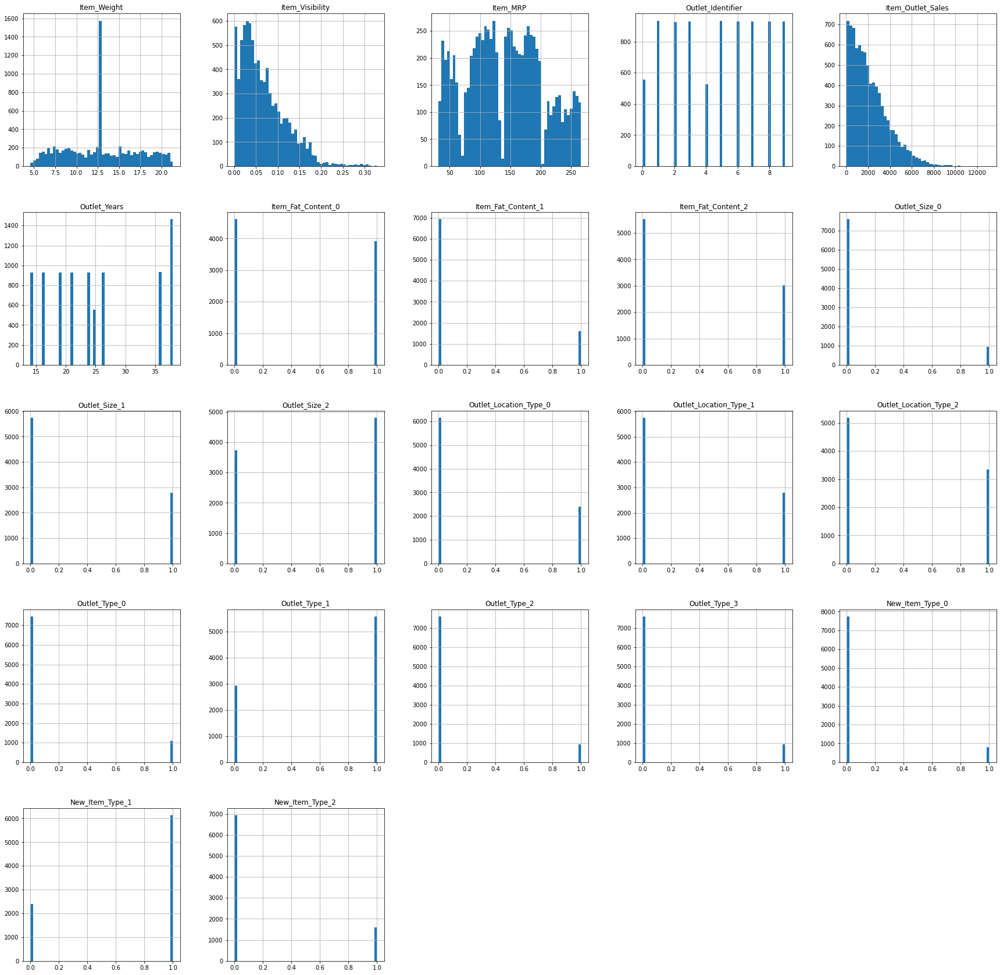

In [ ]:
# Distribution in attributes
%matplotlib inline
import matplotlib.pyplot as plt
df.hist(bins=50, figsize=(30,30))
plt.show()


### Histogram Insight: -

Histogram helps in identifying the following:
- View the shape of your data set’s distribution to look for outliers or other significant data points.

- Determine whether something significant has boccurred from one time period to another.

### Why Histogram? 

It is used to illustrate the major features of the distribution of the data in a convenient form. It is also useful when dealing with large data sets (greater than 100 observations). It can help detect any unusual observations (outliers) or any gaps in the data.

From the above graphical representation we can identify that the highest bar represents the outliers which is above the maximum range.

We can also identify that the values are moving on the right side, which determines positive and the centered values determines normal skewness.

# 2. Distplot

A Distplot or distribution plot, depicts the variation in the data distribution. Seaborn Distplot represents the overall distribution of continuous data variables. The Seaborn module along with the Matplotlib module is used to depict the distplot with different variations in it 

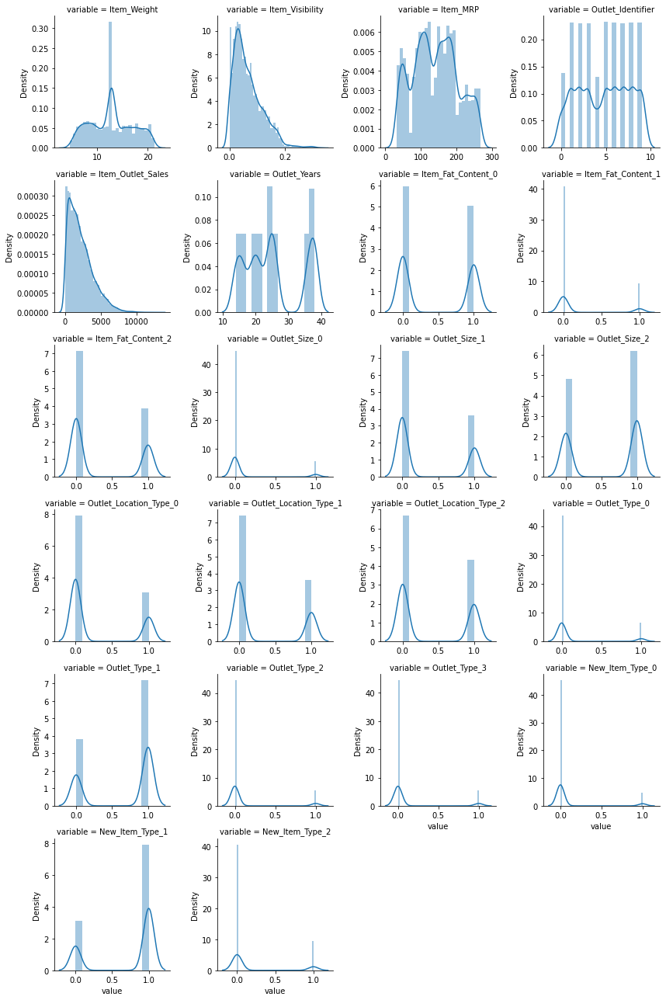

In [ ]:
num = [f for f in df.columns if df.dtypes[f] != 'object']
nd = pd.melt(df, value_vars = num)
n1 = sns.FacetGrid (nd, col='variable', col_wrap=4, sharex=False, sharey = False)
n1 = n1.map(sns.distplot, 'value')
n1

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Item_Weight             8523 non-null   float64
 1   Item_Visibility         8523 non-null   float64
 2   Item_MRP                8523 non-null   float64
 3   Outlet_Identifier       8523 non-null   int64  
 4   Item_Outlet_Sales       8523 non-null   float64
 5   Outlet_Years            8523 non-null   int64  
 6   Item_Fat_Content_0      8523 non-null   uint8  
 7   Item_Fat_Content_1      8523 non-null   uint8  
 8   Item_Fat_Content_2      8523 non-null   uint8  
 9   Outlet_Size_0           8523 non-null   uint8  
 10  Outlet_Size_1           8523 non-null   uint8  
 11  Outlet_Size_2           8523 non-null   uint8  
 12  Outlet_Location_Type_0  8523 non-null   uint8  
 13  Outlet_Location_Type_1  8523 non-null   uint8  
 14  Outlet_Location_Type_2  8523 non-null   

### Distplot Insights: -

Above is the distrution bar graphs to confirm about the statistics of the data about the skewness, the above results are:
1. 18 columns are positive skewed & 3 negative skewed namely 'New_Item_Type_1','Outlet_Type_1', 'Outlet_Size_2'.
2. 1 column is added here i.e Item_Outlet_Sales which is our target variable ~ which is also +ve skewed. In that case we'll need to log transform this variable so that it becomes normally distributed. A normally distributed (or close to normal) target variable helps in better modeling the relationship between target and independent variables

### Why Distplot?
Skewness is demonstrated on a bell curve when data points are not distributed symmetrically to the left and right sides of the median on a bell curve. If the bell curve is shifted to the left or the right, it is said to be skewed.

We can observe that the bell curve is shifted to left we indicates positive skewness.As all the column are positively skewed we don't need to do scaling.

Let's proceed and check the distribution of the target variable.


#### The target variable is positively skewed.A normally distributed (or close to normal) target variable helps in better modeling the relationship between target and independent variables. 

# 3. Heatmap




A heatmap (or heat map) is a graphical representation of data where values are depicted by color.Heatmaps make it easy to visualize complex data and understand it at a glance 

__Correlation__ - A positive correlation is a relationship between two variables in which both variables move in the same direction. Therefore, when one variable increases as the other variable increases, or one variable decreases while the other decreases.

Correlation can have a value:

- 1 is a perfect positive correlation
- 0 is no correlation (the values don't seem linked at all)
- -1 is a perfect negative correlation



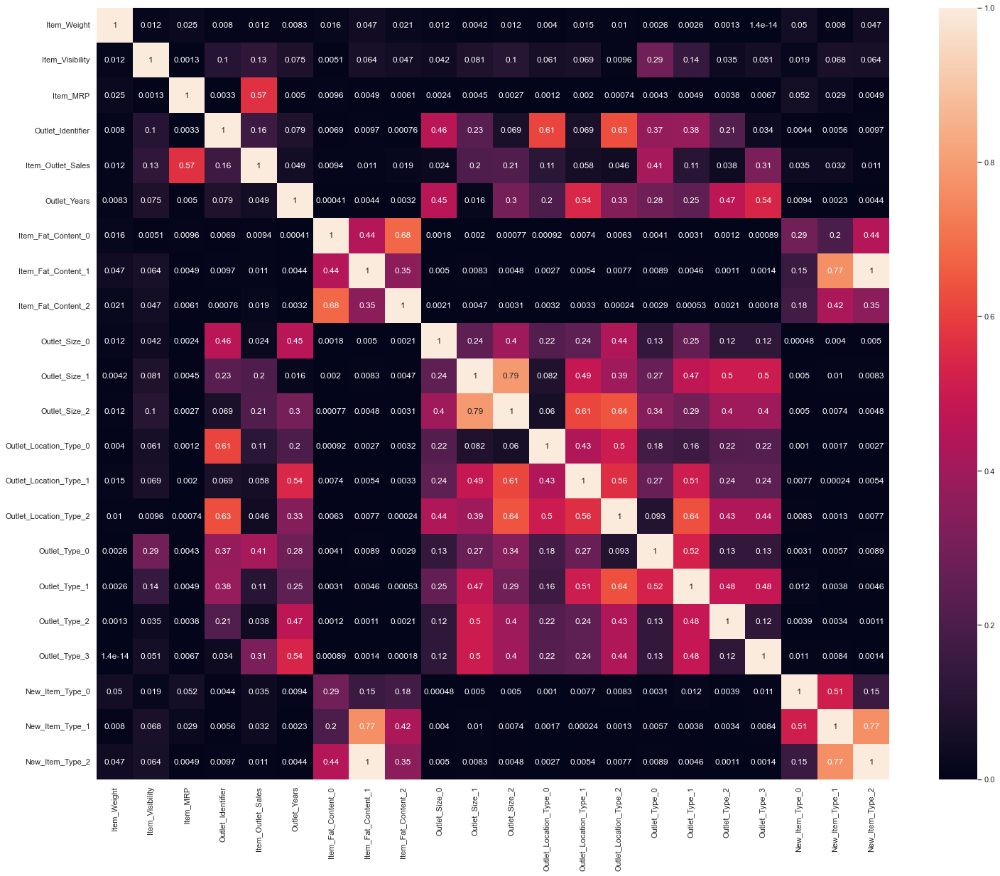

In [ ]:
#correlation plot
sns.set(rc = {'figure.figsize':(25,20)})
corr = df.corr().abs()
sns.heatmap(corr,annot=True) 
plt.show()

### Notice the last column from right side of this map. We can see the correlation of all variables against diagnosis. As you can see, some variables seem to be strongly correlated with the target variable. Here, a numeric correlation score will help us understand the graph better.

In [ ]:
print (corr['Item_Outlet_Sales'].sort_values(ascending=False)[:10], '\n') #top 15 values
print ('----------------------')
print (corr['Item_Outlet_Sales'].sort_values(ascending=False)[-10:]) #last 5 values`

Item_Outlet_Sales         1.000000
Item_MRP                  0.567574
Outlet_Type_0             0.411727
Outlet_Type_3             0.311192
Outlet_Size_2             0.208912
Outlet_Size_1             0.204701
Outlet_Identifier         0.162325
Item_Visibility           0.128625
Outlet_Location_Type_0    0.111287
Outlet_Type_1             0.108765
Name: Item_Outlet_Sales, dtype: float64 

----------------------
Outlet_Location_Type_2    0.046376
Outlet_Type_2             0.038059
New_Item_Type_0           0.034672
New_Item_Type_1           0.031905
Outlet_Size_0             0.024170
Item_Fat_Content_2        0.018719
Item_Weight               0.011550
Item_Fat_Content_1        0.010861
New_Item_Type_2           0.010861
Item_Fat_Content_0        0.009438
Name: Item_Outlet_Sales, dtype: float64


Here we see that the concave points_worst feature is 79% correlated with the target variable. Concave points represent the number of indentations present on the nuclear border.This parameter was found to be statistically significant (P < 0.0001) in differentiating hyperplasia from carcinoma.

In [ ]:
corr

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Identifier,Item_Outlet_Sales,Outlet_Years,Item_Fat_Content_0,Item_Fat_Content_1,Item_Fat_Content_2,Outlet_Size_0,...,Outlet_Location_Type_0,Outlet_Location_Type_1,Outlet_Location_Type_2,Outlet_Type_0,Outlet_Type_1,Outlet_Type_2,Outlet_Type_3,New_Item_Type_0,New_Item_Type_1,New_Item_Type_2
Item_Weight,1.000000e+00,0.012049,0.024756,0.007975,0.011550,0.008301,0.016422,0.046858,0.021157,0.012313,...,0.003965,0.014675,0.010447,0.002568,0.002649,0.001299,1.420504e-14,0.050492,0.007953,0.046858
Item_Visibility,1.204853e-02,1.000000,0.001315,0.100439,0.128625,0.074834,0.005053,0.064358,0.047314,0.041937,...,0.061346,0.068787,0.009650,0.286400,0.144249,0.034671,5.114446e-02,0.018908,0.068133,0.064358
Item_MRP,2.475610e-02,0.001315,1.000000,0.003319,0.567574,0.005020,0.009619,0.004859,0.006063,0.002438,...,0.001229,0.001951,0.000744,0.004277,0.004885,0.003850,6.713699e-03,0.051733,0.029315,0.004859
Outlet_Identifier,7.974756e-03,0.100439,0.003319,1.000000,0.162325,0.079035,0.006896,0.009738,0.000764,0.459730,...,0.611954,0.069080,0.629001,0.372802,0.377479,0.212202,3.436238e-02,0.004384,0.005613,0.009738
Item_Outlet_Sales,1.155000e-02,0.128625,0.567574,0.162325,1.000000,0.049135,0.009438,0.010861,0.018719,0.024170,...,0.111287,0.058261,0.046376,0.411727,0.108765,0.038059,3.111920e-01,0.034672,0.031905,0.010861
Outlet_Years,8.300836e-03,0.074834,0.005020,0.079035,0.049135,1.000000,0.000415,0.004385,0.003151,0.453388,...,0.201690,0.540820,0.333895,0.281196,0.245070,0.466336,5.380723e-01,0.009441,0.002312,0.004385
Item_Fat_Content_0,1.642178e-02,0.005053,0.009619,0.006896,0.009438,0.000415,1.000000,0.443265,0.680864,0.001839,...,0.000921,0.007400,0.006259,0.004137,0.003103,0.001209,8.911961e-04,0.291339,0.195997,0.443265
Item_Fat_Content_1,4.685780e-02,0.064358,0.004859,0.009738,0.010861,0.004385,0.443265,1.000000,0.354722,0.004957,...,0.002685,0.005443,0.007695,0.008860,0.004614,0.001063,1.361078e-03,0.154560,0.768023,1.000000
Item_Fat_Content_2,2.115731e-02,0.047314,0.006063,0.000764,0.018719,0.003151,0.680864,0.354722,1.000000,0.002132,...,0.003155,0.003272,0.000241,0.002924,0.000533,0.002129,1.825365e-04,0.177593,0.423092,0.354722
Outlet_Size_0,1.231336e-02,0.041937,0.002438,0.459730,0.024170,0.453388,0.001839,0.004957,0.002132,1.000000,...,0.218609,0.244113,0.435419,0.133686,0.254668,0.122481,1.229987e-01,0.000479,0.003993,0.004957


### Heatmap insights: -

As we know, it is recommended to avoid correlated features in your dataset. Indeed, a group of highly correlated features will not bring additional information (or just very few), but will increase the complexity of the algorithm, hence increasing the risk of errors.




### Why Heatmap?

Heatmaps are used to show relationships between two variables, one plotted on each axis. By observing how cell colors change across each axis, you can observe if there are any patterns in value for one or both variables.

In [ ]:
# Create correlation matrix
corr_matrix = df.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool_))

# Find index of feature columns with correlation greater than 0.8
to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]

In [ ]:
to_drop

['New_Item_Type_2']

In [ ]:
df.drop(['New_Item_Type_2'], axis=1, inplace=True)

These are the columns that we have to drop. 

In [ ]:
df.head()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Identifier,Item_Outlet_Sales,Outlet_Years,Item_Fat_Content_0,Item_Fat_Content_1,Item_Fat_Content_2,Outlet_Size_0,...,Outlet_Size_2,Outlet_Location_Type_0,Outlet_Location_Type_1,Outlet_Location_Type_2,Outlet_Type_0,Outlet_Type_1,Outlet_Type_2,Outlet_Type_3,New_Item_Type_0,New_Item_Type_1
0,9.30,0.016047,249.8092,9,3735.1380,24,1,0,0,0,...,0,1,0,0,0,1,0,0,0,1
1,5.92,0.019278,48.2692,3,443.4228,14,0,0,1,0,...,0,0,0,1,0,0,1,0,1,0
2,17.50,0.016760,141.6180,9,2097.2700,24,1,0,0,0,...,0,1,0,0,0,1,0,0,0,1
3,19.20,0.000000,182.0950,0,732.3800,25,0,0,1,0,...,1,0,0,1,1,0,0,0,0,1
4,8.93,0.000000,53.8614,1,994.7052,36,0,1,0,1,...,0,0,0,1,0,1,0,0,0,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Item_Weight             8523 non-null   float64
 1   Item_Visibility         8523 non-null   float64
 2   Item_MRP                8523 non-null   float64
 3   Outlet_Identifier       8523 non-null   int64  
 4   Item_Outlet_Sales       8523 non-null   float64
 5   Outlet_Years            8523 non-null   int64  
 6   Item_Fat_Content_0      8523 non-null   uint8  
 7   Item_Fat_Content_1      8523 non-null   uint8  
 8   Item_Fat_Content_2      8523 non-null   uint8  
 9   Outlet_Size_0           8523 non-null   uint8  
 10  Outlet_Size_1           8523 non-null   uint8  
 11  Outlet_Size_2           8523 non-null   uint8  
 12  Outlet_Location_Type_0  8523 non-null   uint8  
 13  Outlet_Location_Type_1  8523 non-null   uint8  
 14  Outlet_Location_Type_2  8523 non-null   

Here, we are checking which columns we have after "to-drop".

# 4. Boxplot

![211626365402575-b88c4d0fdacd5abb4c3dc2de3bc004bb.png](attachment:211626365402575-b88c4d0fdacd5abb4c3dc2de3bc004bb.png)

A boxplot is a standardized way of displaying the distribution of data based on a five number summary (“minimum”, first quartile [Q1], median, third quartile [Q3] and “maximum”).

Basically, to find the outlier in a dataset/column.

In [ ]:
features = [ 'Item_Weight', 
            'Item_Visibility', 
            'Item_MRP', 
            'Outlet_Years', 
            
            'Outlet_Identifier',
            'Item_Fat_Content_0','Item_Fat_Content_1', 'Item_Fat_Content_2',
            'Outlet_Size_0', 'Outlet_Size_1', 'Outlet_Size_2',
            'Outlet_Location_Type_0', 'Outlet_Location_Type_1', 'Outlet_Location_Type_2',
            'Outlet_Type_0', 'Outlet_Type_1', 'Outlet_Type_2', 'Outlet_Type_3',
            'New_Item_Type_0', 'New_Item_Type_1', 
             
           ]

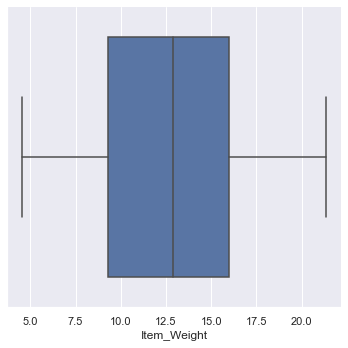

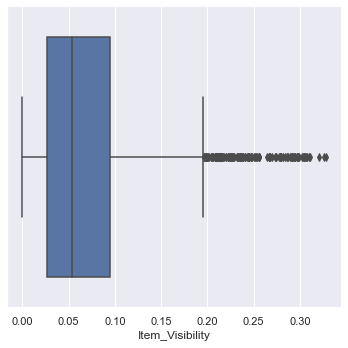

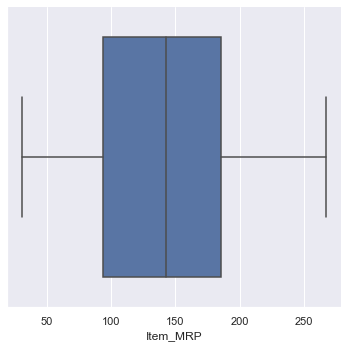

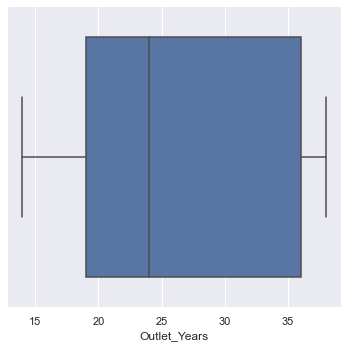

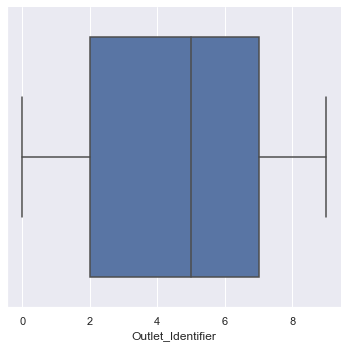

...

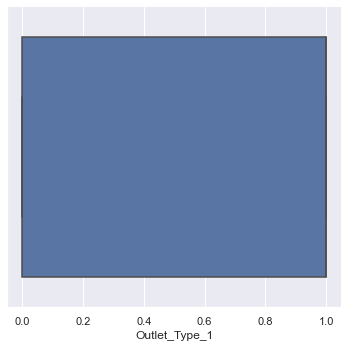

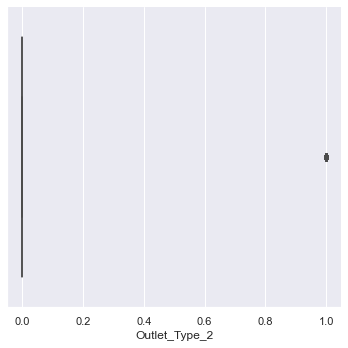

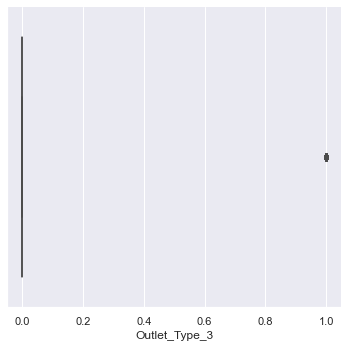

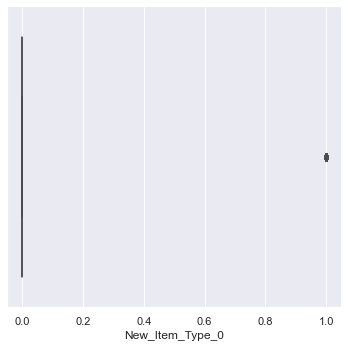

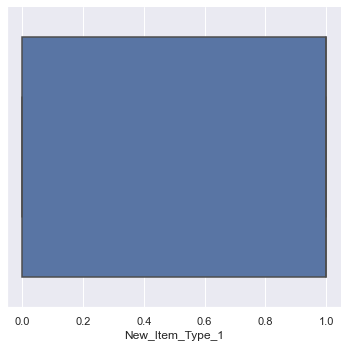

In [ ]:
for value in features:
    sns.catplot(data=df, x=value,  kind="box")

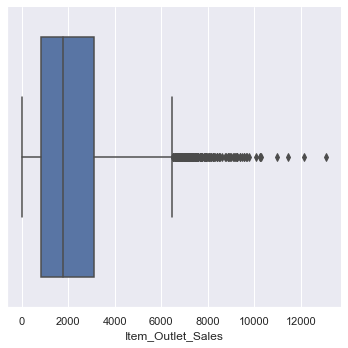

In [ ]:
#for target variable
sns.catplot(data=df, x='Item_Outlet_Sales', kind='box')

#### The dark points are known as Outliers. Outliers are those data points that are significantly different from the rest of the dataset. They are often abnormal observations that skew the data distribution, and arise due to inconsistent data entry, or erroneous observations.

### Boxplot Insights: - 
- Sometimes outliers may be an error in the data and should be removed. In this case these points are correct readings yet they are different from the other points that they appear to be incorrect.

- The best way to decide wether to remove them or not is to train models with and without these data points and compare their validation accuracy.

- So we will keep it unchanged as it won't affect our model.

Here, we can see that most of the variables possess outlier values. It would take us days if we start treating these outlier values one by one. Hence, for now we'll leave them as is and let our algorithm deal with them. As we know, tree-based algorithms are usually robust to outliers.

### Why Boxplot?
Box plots are used to show distributions of numeric data values, especially when you want to compare them between multiple groups. They are built to provide high-level information at a glance, offering general information about a group of data's symmetry, skew, variance, and outliers.



# 5. Scatter plot

Scatter plots are the graphs that present the relationship between two variables in a data-set. It represents data points on a two-dimensional plane or on a Cartesian system. The independent variable or attribute is plotted on the X-axis, while the dependent variable is plotted on the Y-axis. These plots are often called scatter graphs or scatter diagrams.




In [ ]:
import plotly.express as px
for value in features:
    figure = px.scatter(data_frame= df,x = value,y = 'Item_Outlet_Sales',trendline = 'ols')
    
    figure.show()


The line between both the variables is called Best For Line. The least Sum of Squares of Errors is used as the cost function for Linear Regression. For all possible lines, calculate the sum of squares of errors. The line which has the least sum of squares of errors is the best fit line.The line drawn in a scatter plot, which is near to almost all the points in the plot is known as “line of best fit” or “trend line“.


### Scatter plot Insight:
We can observe that various variables like Outlet_Type_3, Outlet_Type_1 age,bmi,smoker shows continous increase in price. Which relates that these variables are highly correlated with the target variables.


# Why scatter plot?

Scatter plots are used in either of the following situations.

* When we have paired numerical data
* When there are multiple values of the dependent variable for a unique value of an independent variable
* In determining the relationship between variables in some scenarios, such as identifying potential root causes of problems, checking whether two products that appear to be related both occur with the exact cause and so on.

In the next step we will divide our cleaned data into training data and testing data.

# Step 2: Data Preparation
**Goal:-**

Tasks we are going to in this step:

1. Now we will spearate the target variable and feature columns in two different dataframe and will check the shape of the dataset for validation purpose.
2. Split dataset into train and test dataset.
3. Scaling on train dataset.

**1. Now we spearate the target variable and feature columns in two different dataframe and will check the shape of the dataset for validation purpose.**

In [ ]:
# Separate target and feature column in X and y variable

target = 'Item_Outlet_Sales'

# X will be the features
X = df.drop(target,axis=1) 
#y will be the target variable
y = df[target]

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Item_Weight             8523 non-null   float64
 1   Item_Visibility         8523 non-null   float64
 2   Item_MRP                8523 non-null   float64
 3   Outlet_Identifier       8523 non-null   int64  
 4   Outlet_Years            8523 non-null   int64  
 5   Item_Fat_Content_0      8523 non-null   uint8  
 6   Item_Fat_Content_1      8523 non-null   uint8  
 7   Item_Fat_Content_2      8523 non-null   uint8  
 8   Outlet_Size_0           8523 non-null   uint8  
 9   Outlet_Size_1           8523 non-null   uint8  
 10  Outlet_Size_2           8523 non-null   uint8  
 11  Outlet_Location_Type_0  8523 non-null   uint8  
 12  Outlet_Location_Type_1  8523 non-null   uint8  
 13  Outlet_Location_Type_2  8523 non-null   uint8  
 14  Outlet_Type_0           8523 non-null   

In [ ]:
y

0       3735.1380
1        443.4228
2       2097.2700
3        732.3800
4        994.7052
          ...    
8518    2778.3834
8519     549.2850
8520    1193.1136
8521    1845.5976
8522     765.6700
Name: Item_Outlet_Sales, Length: 8523, dtype: float64

In [ ]:
# Check the shape of X and y variable
X.shape, y.shape

((8523, 20), (8523,))

In [ ]:
# Reshape the y variable 
y = y.values.reshape(-1,1)

In [ ]:
# Again check the shape of X and y variable
X.shape, y.shape

((8523, 20), (8523, 1))

#### 2. Spliting the dataset in training and testing data. 

*Here we are spliting our dataset into 80/20 percentage where 80% dataset goes into the training part and 20% goes into testing  part.*

In [ ]:
# Split the X and y into X_train, X_test, y_train, y_test variables with 80-20% split.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Check shape of the splitted variables
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((6818, 20), (1705, 20), (6818, 1), (1705, 1))

### Insights: -

Train test split technique is used to estimate the performance of machine learning algorithms which are used to make predictions on data not used to train the model.It is a fast and easy procedure to perform, the results of which allow you to compare the performance of machine learning algorithms for your predictive modeling problem. Although simple to use and interpret, there are times when the procedure should not be used, such as when you have a small dataset and situations where additional configuration is required, such as when it is used for classification and the dataset is not balanced.

In the next step we will train our model on the basis of our training and testing data.

# Step 3: Model Training

#### Goal:
In this step we are going to train our dataset on different linear regression algorithms. As we know that our target variable is in continuous format so we have to apply linear regression algorithm. 

__Algorithms we are going to use in this step__

1. Linear Regression (no regularization)
2. Lasso Regression (L1 regularization)
3. Ridge Regression (L2 regularization)

K-fold cross validation is a procedure used to estimate the skill of the model on new data. There are common tactics that you can use to select the value of k for your dataset. There are commonly used variations on cross-validation, such as stratified and repeated, that are available in scikit-learn

In [ ]:
# Define kfold with 10 split
cv = KFold(n_splits=10, shuffle=True, random_state=42)

The goal of cross-validation is to test the model's ability to predict new data that was not used in estimating it, in order to flag problems like overfitting or selection bias and to give an insight on how the model will generalize to an independent dataset (i.e., an unknown dataset, for instance from a real problem).

# 1. Linear Regression(no regularization)

Linear regression analysis is used to predict the value of a variable based on the value of another variable. The variable you want to predict is called the dependent variable. The variable you are using to predict the other variable's value is called the independent variable. Its comes under Supervised Learning technique.

So, Linear regression predicts the output of a numerical dependent variable. Therefore the outcome must be a numerical or continuous value. 

#### Train set cross-validation 

In [ ]:
#Using Linear Regression Algorithm to the Training Set
from sklearn.linear_model import LinearRegression

lin_R = LinearRegression() #Object Creation

lin_R.fit(X_train, y_train)

LinearRegression()

In [ ]:
#Accuracy check of trainig data

#Get R2 score
lin_R.score(X_train, y_train)


0.5589759314947367

In [ ]:
#Accuracy check of test data

#Get R2 score
lin_R.score(X_test, y_test) 

0.5807866075238401

In [ ]:
# Getting kfold values
lr_scores = -1 * cross_val_score(lin_R, 
                                 X_train, 
                                 y_train, 
                                 cv=cv, 
                                 scoring='neg_root_mean_squared_error')
lr_scores

array([1148.73091609, 1189.37805735, 1126.63659075, 1057.19035736,
       1141.76683205, 1131.65665986, 1121.6084951 , 1169.52344335,
       1146.94277632, 1212.16988853])

In [ ]:
# Mean of the train kfold scores
lr_score_train = np.mean(lr_scores)
lr_score_train

1144.5604016761552

### Prediction 

Now we will perform prediction on the dataset using Linear Regression.

In [ ]:
# Predict the values on X_test_scaled dataset 
y_predicted = lin_R.predict(X_test)

## Evaluating all kinds of evaluating parameters. 


#### MAE :
MAE is a very simple metric which calculates the absolute difference between actual and predicted values.Now you have to find the MAE of your model which is basically a mistake made by the model known as an error. Now find the difference between the actual value and predicted value that is an absolute error but we have to find the mean absolute of the complete dataset.

so, sum all the errors and divide them by a total number of observations And this is MAE. And we aim to get a minimum MAE because this is a loss.

#### MSE:
MSE is a most used and very simple metric with a little bit of change in mean absolute error. Mean squared error states that finding the squared difference between actual and predicted value. We perform squared to avoid the cancellation of negative terms and it is the benefit of MSE.

#### RMSE :
As RMSE is clear by the name itself, that it is a simple square root of mean squared error.

Most of the time people use RMSE as an evaluation metric and mostly when you are working with deep learning techniques the most preferred metric is RMSE.

In [ ]:
from sklearn.metrics import mean_absolute_error
print("MAE",mean_absolute_error(y_test,y_predicted))

MAE 791.1614174887682


In [ ]:
# Evaluating

from sklearn.metrics import mean_absolute_error

print("The model used is Linear Regression")

lr_score_test = mean_absolute_error(y_test,y_predicted) 
print(f"\nThe MAE is: {lr_score_test} " )
  
lr_score_test= mean_squared_error(y_test, y_predicted)
print(f"\nThe MSE is: {lr_score_test} ")
  
lr_score_test = np.sqrt(mean_squared_error(y_test, y_predicted)) 
print(f"\nThe RMSE is: {lr_score_test}")


The model used is Linear Regression

The MAE is: 791.1614174887682 

The MSE is: 1139409.4522750506 

The RMSE is: 1067.4312400689098


# 2. Lasso Regression (L1 regularization)



Lasso regression is a type of linear regression that uses shrinkage. Shrinkage is where data values are shrunk towards a central point, like the mean. The lasso procedure encourages simple, sparse models (i.e. models with fewer parameters). This particular type of regression is well-suited for models showing high levels of muticollinearity or when you want to automate certain parts of model selection, like variable selection/parameter elimination.


#### L1 Regularization

Lasso regression performs L1 regularization, which adds a penalty equal to the absolute value of the magnitude of coefficients. This type of regularization can result in sparse models with few coefficients; Some coefficients can become zero and eliminated from the model. Larger penalties result in coefficient values closer to zero, which is the ideal for producing simpler models. On the other hand, L2 regularization (e.g. Ridge regression) doesn’t result in elimination of coefficients or sparse models. This makes the Lasso far easier to interpret than the Ridge.



In [ ]:
#Using Lasso Regression Method to the Training dataset
ls_reg = LassoCV()
ls_reg = ls_reg.fit(X_train, y_train)


In [ ]:
#Accuracy check of trainig data
#Get R2 score
ls_reg.score(X_train, y_train)

0.5319111129428855

In [ ]:
#Accuracy check of test data
#Get R2 score
ls_reg.score(X_test, y_test) 

0.5516614895823757

In [ ]:
#Get kfold values
lasso_scores = -1 * cross_val_score(ls_reg, 
                                    X_train, 
                                    y_train, 
                                    cv=cv, 
                                    scoring='neg_root_mean_squared_error')
lasso_scores


array([1183.2615457 , 1217.49933462, 1176.80994686, 1086.40963555,
       1154.73393044, 1163.58440159, 1170.54916459, 1182.46640684,
       1188.2649197 , 1254.48224734])

In [ ]:
# Mean of the train kfold scores
lasso_score_train = np.mean(lasso_scores)
lasso_score_train

1177.8061533224886

### Prediction

In [ ]:
# Predict the values on X_test_scaled dataset 
y_predicted = ls_reg.predict(X_test)

In [ ]:
# Evaluating



print("The model used is Linear Regression")

lasso_score_test = mean_absolute_error(y_test,y_predicted)
print(f"\nThe MAE is: {lasso_score_test}")
  
lasso_score_test = mean_squared_error(y_test, y_predicted)
print(f"\nThe MSE is: {lasso_score_test}")
  
lasso_score_test  = np.sqrt(mean_squared_error(y_test, y_predicted)) 
print(f"\nThe RMSE is: {lasso_score_test}")

The model used is Linear Regression

The MAE is: 811.9186298526014

The MSE is: 1218570.6510266324

The RMSE is: 1103.888876212924


# 3.Ridge regression (L2 regularisation)

Ridge regression is a model tuning method that is used to analyse any data that suffers from multicollinearity. This method performs L2 regularization. When the issue of multicollinearity occurs, least-squares are unbiased, and variances are large, this results in predicted values being far away from the actual values. 



In [ ]:
#Using Ridge Regression Method on Trainig Dataset

ridge_reg = RidgeCV()
ridge_reg = ridge_reg.fit(X_train,y_train)


In [ ]:
#Accuracy check of trainig data
#Get R2 score
ridge_reg.score(X_train, y_train)

0.5589529886409081

In [ ]:
#Accuracy of test data
ridge_reg.score(X_test, y_test) 

0.580639380835096

In [ ]:
# Get kfold values
ridge_scores = -1 * cross_val_score(ridge_reg, 
                                    X_train, 
                                    y_train, 
                                    cv=cv, 
                                    scoring='neg_root_mean_squared_error')
ridge_scores


array([1149.10901593, 1189.30562899, 1126.36328204, 1057.68678802,
       1142.07912692, 1131.79130499, 1121.12776115, 1169.51302579,
       1147.09816712, 1211.66459619])

In [ ]:
# Mean of the train kfold scores
ridge_score_train = np.mean(ridge_scores)
ridge_score_train

1144.5738697138756

### Prediction 

In [ ]:
# predict the values on X_test_scaled dataset 
y_predicted = ridge_reg.predict(X_test)

### Evaluating all kinds of evaluating parameters. 

In [ ]:
# Evaluating
# printing every error of the regressor

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error


print("The model used is Linear Regression")

ridge_score_test = mean_absolute_error(y_test,y_predicted)
print(f"\nThe MAE is: {ridge_score_test}")
  
ridge_score_test = mean_squared_error(y_test, y_predicted)
print(f"\nThe MSE is: {ridge_score_test}")

ridge_score_test = np.sqrt(mean_squared_error(y_test, y_predicted)) 
print(f"\nThe RMSE is: {ridge_score_test}")


The model used is Linear Regression

The MAE is: 791.3110695342745

The MSE is: 1139809.6100080637

The RMSE is: 1067.6186631977093


# Evaluation: -

In [ ]:

train_metrics = np.array([round(lr_score_train,3), 
                          round(lasso_score_train,3), 
                          round(ridge_score_train,3)]) 
train_metrics = pd.DataFrame(train_metrics, columns=['RMSE (Train Set)'])
train_metrics.index = ['Linear Regression', 
                       'Lasso Regression', 
                       'Ridge Regression']
train_metrics

,RMSE (Train Set)
Linear Regression,1144.560
Lasso Regression,1177.806
Ridge Regression,1144.574


In [ ]:
test_metrics = np.array([round(lr_score_test,3),
                         round(lasso_score_test,3), 
                         round(ridge_score_test,3)]) 
test_metrics = pd.DataFrame(test_metrics, columns=['RMSE (Test Set)'])
test_metrics.index = ['Linear Regression',
                      'Lasso Regression', 
                      'Ridge Regression']
test_metrics

,RMSE (Test Set)
Linear Regression,1067.431
Lasso Regression,1103.889
Ridge Regression,1067.619


# Insight:-

* A low RMSE value indicates that the simulated and observed data are close to each other showing a better accuracy. Thus lower the RMSE better is model performance.
* As You can see from above RMSE , we will go with Linear Regression.(According to our dataset).
* But there is no universally “good” RMSE value. It all depends on the range of values in the dataset you’re working with.

# Step 4: Save Model
**Goal:- In this step we are going to save our model in pickel format file.**

In [ ]:
import pickle
pickle.dump(lin_R , open('Big_Mart_Sale_linear.pkl', 'wb'))

In [ ]:
import pickle
pickle.dump(ls_reg , open('Big_Mart_Sale_lasso.pkl', 'wb'))

In [ ]:
import pickle
pickle.dump(ridge_reg , open('Big_Mart_Sale_ridge.pkl', 'wb'))

In [ ]:
import pickle

def model_prediction(features):
    
    pickled_model = pickle.load(open('Big_Mart_Sale_linear.pkl', 'rb'))
    Item_Outlet_Sales = str(list(pickled_model.predict(features)))
    
    return str(f'The Sales is {Item_Outlet_Sales}')

#### We can test our model by giving our own parameters or features to predict. 

In [ ]:
Item_Weight=9.30
#Item_Fat_Content=2

Item_Visibility=0.016047
Item_MRP=249.809200
#New_Item_Type=0
Outlet_Identifier = 9

Outlet_Years=24
#Outlet_Type=2
#Outlet_Location_Type=2
#Outlet_Size=1

Item_Fat_Content_0=1
Item_Fat_Content_1=0
Item_Fat_Content_2=0

Outlet_Size_0=0
Outlet_Size_1=1
Outlet_Size_2=0
            
Outlet_Location_Type_0=1
Outlet_Location_Type_1= 0
Outlet_Location_Type_2=0
            
Outlet_Type_0=0
Outlet_Type_1= 1
Outlet_Type_2= 0
Outlet_Type_3= 0
            
New_Item_Type_0= 0
New_Item_Type_1= 1

#New_Item_Type_2= 0

#Outlet_Identifier=3

In [ ]:
df.iloc[0]

Item_Weight                  9.300000
Item_Visibility              0.016047
Item_MRP                   249.809200
Outlet_Identifier            9.000000
Item_Outlet_Sales         3735.138000
Outlet_Years                24.000000
Item_Fat_Content_0           1.000000
Item_Fat_Content_1           0.000000
Item_Fat_Content_2           0.000000
Outlet_Size_0                0.000000
Outlet_Size_1                1.000000
Outlet_Size_2                0.000000
Outlet_Location_Type_0       1.000000
Outlet_Location_Type_1       0.000000
Outlet_Location_Type_2       0.000000
Outlet_Type_0                0.000000
Outlet_Type_1                1.000000
Outlet_Type_2                0.000000
Outlet_Type_3                0.000000
New_Item_Type_0              0.000000
New_Item_Type_1              1.000000
Name: 0, dtype: float64

In [ ]:
model_prediction([[Item_Weight,
                   #'Item_Fat_Content',  
            Item_Visibility, 
            Item_MRP, 
            #'New_Item_Type', 
            Outlet_Years,
            #'Outlet_Type', 
            #'Outlet_Location_Type', 
            #"Outlet_Size", 
            Outlet_Identifier,
            Item_Fat_Content_0, Item_Fat_Content_1, Item_Fat_Content_2,
            Outlet_Size_0, Outlet_Size_1, Outlet_Size_2,
            Outlet_Location_Type_0, Outlet_Location_Type_1, Outlet_Location_Type_2,
            Outlet_Type_0, Outlet_Type_1, Outlet_Type_2, Outlet_Type_3,
            New_Item_Type_0, New_Item_Type_1, 
            #New_Item_Type_2 
           ]])

'The Sales is [array([8548.15764507])]'

# Step 5: After making model and checking its accuracy, we are going to deploy it in API/ Web App. 

This step holds a great importance as in this step we make a Web API which integrates our model and let it interacts with user.
The user simply put data he is asked to fill and our API will help in predicting.

### There are many methods to create Web Application like Flask, Streamlit, etc. We going to use streamlit to create API. Below is an API refrence. 

https://tinyurl.com/bdexnk6v

# Conclusion

After observing the problem statement we have build an efficient model to overcome it. The above model helps in predicting the sales of Big Mart. It will help the Big Mart to understand the properties of products and stores which play a key role in increasing sales. . The accuracy for the prediction is 58.07%.